### This is notebook is easy to learn. Most of the codes will be run with no bugs.
#### Source
http://gallery.pangeo.io/repos/pangeo-gallery/physical-oceanography/01_sea-surface-height.html

Try to master:
- `intake` and `open_catalog`
- `dask`
- Basic `xarray` knowledge

In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import hvplot.xarray
plt.rcParams['figure.figsize'] = (15,10)
%matplotlib inline

In [4]:
from intake import open_catalog
cat = open_catalog("https://raw.githubusercontent.com/pangeo-data/pangeo-datastore/master/intake-catalogs/master.yaml")
list(cat)

['ocean', 'atmosphere', 'climate', 'hydro']

In [5]:
cat = open_catalog("https://raw.githubusercontent.com/pangeo-data/pangeo-datastore/master/intake-catalogs/ocean.yaml")
list(cat)


['sea_surface_height',
 'cesm_mom6_example',
 'ECCOv4r3',
 'SOSE',
 'GODAS',
 'ECCO_layers',
 'altimetry',
 'LLC4320',
 'GFDL_CM2_6',
 'CESM_POP',
 'channel',
 'MEOM_NEMO']

In [6]:
ds  = cat["sea_surface_height"].to_dask()
ds

<xarray.Dataset>
Dimensions:    (time: 8901, latitude: 720, longitude: 1440, nv: 2)
Coordinates:
    crs        int32 ...
    lat_bnds   (time, latitude, nv) float32 dask.array<chunksize=(5, 720, 2), meta=np.ndarray>
  * latitude   (latitude) float32 -89.88 -89.62 -89.38 ... 89.38 89.62 89.88
    lon_bnds   (longitude, nv) float32 dask.array<chunksize=(1440, 2), meta=np.ndarray>
  * longitude  (longitude) float32 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9
  * nv         (nv) int32 0 1
  * time       (time) datetime64[ns] 1993-01-01 1993-01-02 ... 2017-05-15
Data variables:
    adt        (time, latitude, longitude) float64 dask.array<chunksize=(5, 720, 1440), meta=np.ndarray>
    err        (time, latitude, longitude) float64 dask.array<chunksize=(5, 720, 1440), meta=np.ndarray>
    sla        (time, latitude, longitude) float64 dask.array<chunksize=(5, 720, 1440), meta=np.ndarray>
    ugos       (time, latitude, longitude) float64 dask.array<chunksize=(5, 720, 1440), meta=np.ndarray>
    ugosa      (time, latitude, longitude) float64 dask.array<chunksize=(5, 720, 1440), meta=np.ndarray>
    vgos       (time, latitude, longitude) float64 dask.array<chunksize=(5, 720, 1440), meta=np.ndarray>
    vgosa      (time, latitude, longitude) float64 dask.array<chunksize=(5, 720, 1440), meta=np.ndarray>
Attributes: (12/43)
    Conventions:                     CF-1.6
    Metadata_Conventions:            Unidata Dataset Discovery v1.0
    cdm_data_type:                   Grid
    comment:                         Sea Surface Height measured by Altimetry...
    contact:                         servicedesk.cmems@mercator-ocean.eu
    creator_email:                   servicedesk.cmems@mercator-ocean.eu
    ...                              ...
    summary:                         SSALTO/DUACS Delayed-Time Level-4 sea su...
    time_coverage_duration:          P1D
    time_coverage_end:               1993-01-01T12:00:00Z
    time_coverage_resolution:        P1D
    time_coverage_start:             1992-12-31T12:00:00Z
    title:                           DT merged all satellites Global Ocean Gr...

In [11]:
ds.sla

<xarray.DataArray 'sla' (time: 8901, latitude: 720, longitude: 1440)>
dask.array<open_dataset-ab02c27f0096e26df3010a5fc101ad3bsla, shape=(8901, 720, 1440), dtype=float64, chunksize=(5, 720, 1440), chunktype=numpy.ndarray>
Coordinates:
    crs        int32 ...
  * latitude   (latitude) float32 -89.88 -89.62 -89.38 ... 89.38 89.62 89.88
  * longitude  (longitude) float32 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9
  * time       (time) datetime64[ns] 1993-01-01 1993-01-02 ... 2017-05-15
Attributes:
    comment:        The sea level anomaly is the sea surface height above mea...
    grid_mapping:   crs
    long_name:      Sea level anomaly
    standard_name:  sea_surface_height_above_sea_level
    units:          m

In [7]:
ds.sla.isel(time=0) # Should have Xarray basic knowledge

<xarray.DataArray 'sla' (latitude: 720, longitude: 1440)>
dask.array<getitem, shape=(720, 1440), dtype=float64, chunksize=(720, 1440), chunktype=numpy.ndarray>
Coordinates:
    crs        int32 ...
  * latitude   (latitude) float32 -89.88 -89.62 -89.38 ... 89.38 89.62 89.88
  * longitude  (longitude) float32 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9
    time       datetime64[ns] 1993-01-01
Attributes:
    comment:        The sea level anomaly is the sea surface height above mea...
    grid_mapping:   crs
    long_name:      Sea level anomaly
    standard_name:  sea_surface_height_above_sea_level
    units:          m

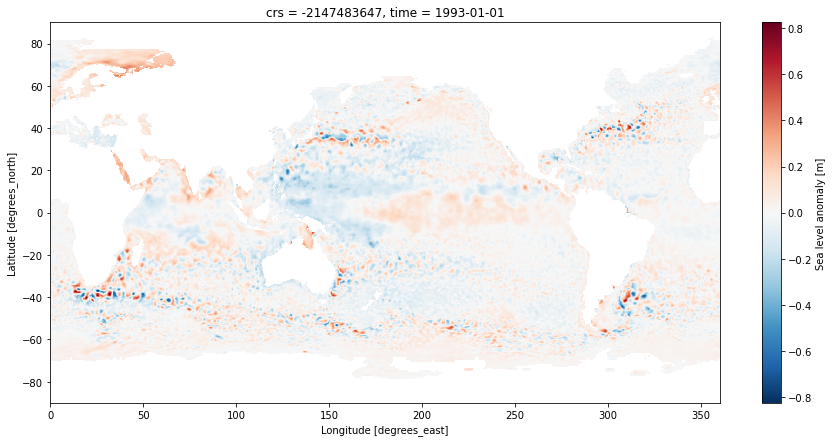

In [13]:
ds.sla.isel(time=0).plot(figsize=(15, 7))

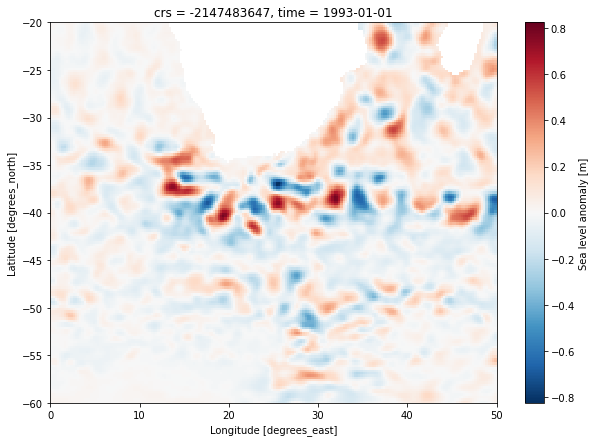

In [10]:
ds.sla.isel(time=0).sel(latitude=slice(-60,-20),longitude=slice(0,50)).plot(figsize=(10, 7))

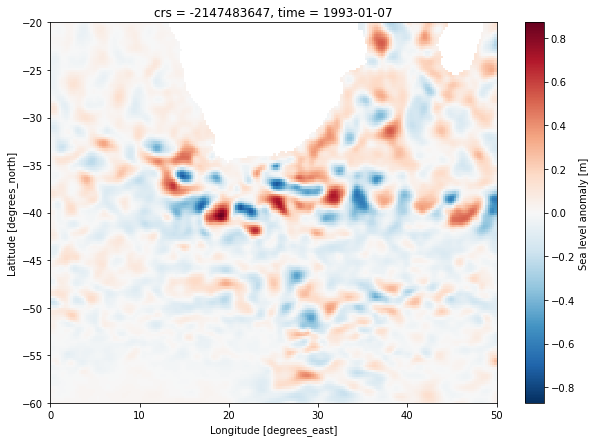

In [14]:
ds.sla.sel(time="1993-01-07",latitude=slice(-60,-20),longitude=slice(0,50)).plot(figsize=(10, 7))

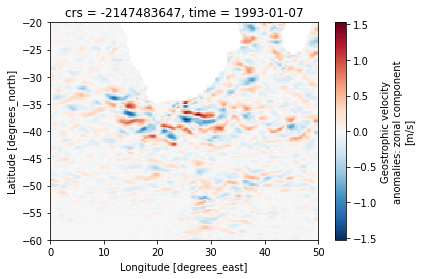

In [8]:
ds.ugosa.sel(time="1993-01-07",latitude=slice(-60,-20),longitude=slice(0,50)).plot()

In [19]:
ds.sel(time="1993-01-07",latitude=slice(-60,-20),longitude=slice(0,50)).to_netcdf("ssh.nc")

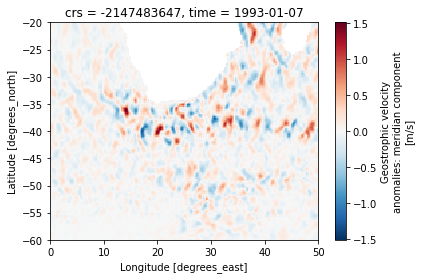

In [9]:
ds.vgosa.sel(time="1993-01-07",latitude=slice(-60,-20),longitude=slice(0,50)).plot()

In [3]:
ds.sla.hvplot.image('longitude', 'latitude',
                    rasterize=True, dynamic=True, width=800, height=450,
                    widget_type='scrubber', widget_location='bottom', cmap='RdBu_r')

Column
    [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] Player(end=8900, width=550)
        [2] HSpacer()

In [15]:
from dask_gateway import GatewayCluster
from dask.distributed import Client
cluster = GatewayCluster()
cluster.scale(5) # worker number
client = Client(cluster)
cluster

In [16]:
# the number of GB involved in the reduction
ds.sla.nbytes/1e9

73.8284544

In [18]:
ds.sla.mean(dim=('latitude', 'longitude'))

<xarray.DataArray 'sla' (time: 8901)>
dask.array<mean_agg-aggregate, shape=(8901,), dtype=float64, chunksize=(5,), chunktype=numpy.ndarray>
Coordinates:
    crs      int32 ...
  * time     (time) datetime64[ns] 1993-01-01 1993-01-02 ... 2017-05-15

In [22]:
# the computationally intensive step
# More than 70G data. Less than one minutes
# %%time
%time sla_timeseries = ds.sla.mean(dim=('latitude', 'longitude')).load()

CPU times: user 1.43 s, sys: 116 ms, total: 1.55 s
Wall time: 1min 27s


In [23]:
sla_timeseries

<xarray.DataArray 'sla' (time: 8901)>
array([0.00207974, 0.00185178, 0.00166995, ..., 0.06688241, 0.06690208,
       0.0668637 ])
Coordinates:
    crs      int32 -2147483647
  * time     (time) datetime64[ns] 1993-01-01 1993-01-02 ... 2017-05-15

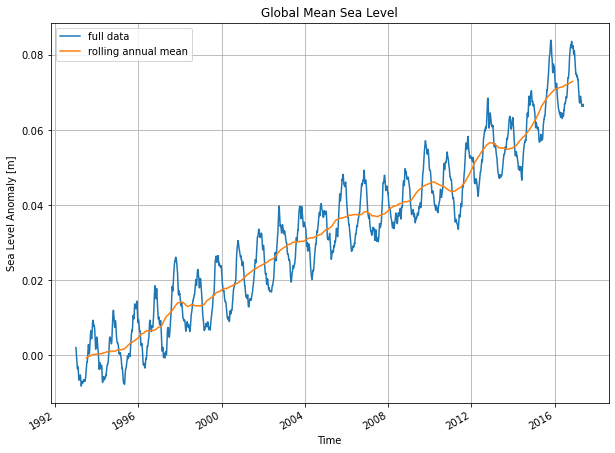

In [23]:
sla_timeseries.plot(label='full data',figsize=(10, 7))
sla_timeseries.rolling(time=365, center=True).mean().plot(label='rolling annual mean')
plt.ylabel('Sea Level Anomaly [m]')
plt.title('Global Mean Sea Level')
plt.legend()
plt.grid()



In order to understand how the sea level rise is distributed in latitude, we can make a sort of [Hovmöller diagram](https://en.wikipedia.org/wiki/Hovm%C3%B6ller_diagram).

In [8]:
ds.sla

<xarray.DataArray 'sla' (time: 8901, latitude: 720, longitude: 1440)>
dask.array<open_dataset-ab02c27f0096e26df3010a5fc101ad3bsla, shape=(8901, 720, 1440), dtype=float64, chunksize=(5, 720, 1440), chunktype=numpy.ndarray>
Coordinates:
    crs        int32 ...
  * latitude   (latitude) float32 -89.88 -89.62 -89.38 ... 89.38 89.62 89.88
  * longitude  (longitude) float32 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9
  * time       (time) datetime64[ns] 1993-01-01 1993-01-02 ... 2017-05-15
Attributes:
    comment:        The sea level anomaly is the sea surface height above mea...
    grid_mapping:   crs
    long_name:      Sea level anomaly
    standard_name:  sea_surface_height_above_sea_level
    units:          m

In [9]:
ds.sla.mean(dim='longitude')

<xarray.DataArray 'sla' (time: 8901, latitude: 720)>
dask.array<mean_agg-aggregate, shape=(8901, 720), dtype=float64, chunksize=(5, 720), chunktype=numpy.ndarray>
Coordinates:
    crs       int32 ...
  * latitude  (latitude) float32 -89.88 -89.62 -89.38 ... 89.38 89.62 89.88
  * time      (time) datetime64[ns] 1993-01-01 1993-01-02 ... 2017-05-15

In [24]:
sla_hov = ds.sla.mean(dim='longitude').load()
# 2 min processing

In [25]:
sla_hov

<xarray.DataArray 'sla' (time: 8901, latitude: 720)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    crs       int32 -2147483647
  * latitude  (latitude) float32 -89.88 -89.62 -89.38 ... 89.38 89.62 89.88
  * time      (time) datetime64[ns] 1993-01-01 1993-01-02 ... 2017-05-15

In [14]:
sla_hov.transpose() # 转置矩阵

<xarray.DataArray 'sla' (latitude: 720, time: 8901)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates:
    crs       int32 -2147483647
  * latitude  (latitude) float32 -89.88 -89.62 -89.38 ... 89.38 89.62 89.88
  * time      (time) datetime64[ns] 1993-01-01 1993-01-02 ... 2017-05-15

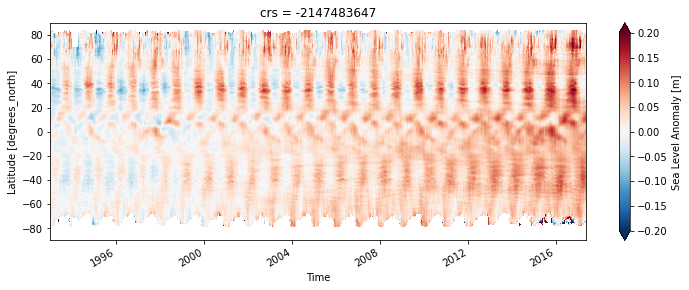

In [26]:
fig, ax = plt.subplots(figsize=(12, 4))

sla_hov.name = 'Sea Level Anomaly [m]'

sla_hov.transpose().plot(vmax=0.2, ax=ax)

### Try two methods for selecting data

In [18]:
sla_hov.isel(latitude=360) #

<xarray.DataArray 'Sea Level Anomaly [m]' (time: 8901)>
array([0.01471477, 0.01501582, 0.01541731, ..., 0.08220087, 0.08107526,
       0.07897841])
Coordinates:
    crs       int32 -2147483647
    latitude  float32 0.125
  * time      (time) datetime64[ns] 1993-01-01 1993-01-02 ... 2017-05-15

In [20]:
sla_hov.sel(latitude=0, method="nearest")

<xarray.DataArray 'Sea Level Anomaly [m]' (time: 8901)>
array([0.01471477, 0.01501582, 0.01541731, ..., 0.08220087, 0.08107526,
       0.07897841])
Coordinates:
    crs       int32 -2147483647
    latitude  float32 0.125
  * time      (time) datetime64[ns] 1993-01-01 1993-01-02 ... 2017-05-15

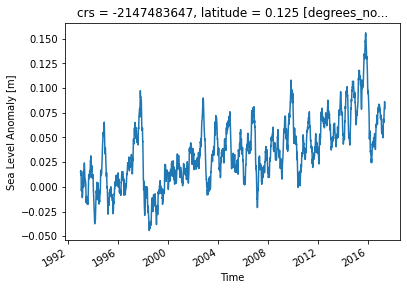

In [22]:
sla_hov.sel(latitude=0, method="nearest").plot()

In [23]:
sla_hov = ds.sla.mean(dim='latitude').load()

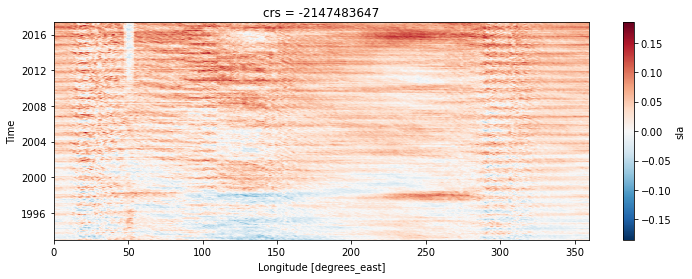

In [24]:
fig, ax = plt.subplots(figsize=(12, 4))
sla_hov.plot()

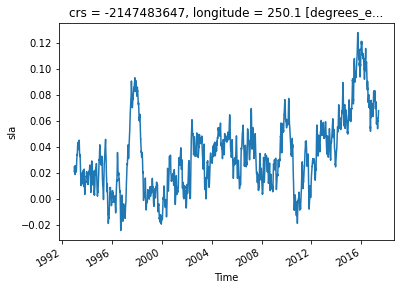

In [25]:
sla_hov.sel(longitude=250, method="nearest").plot()

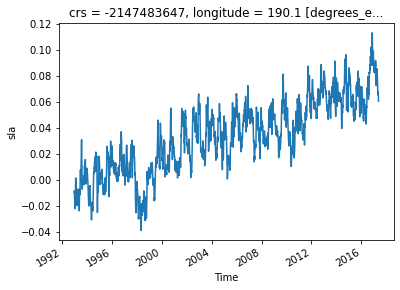

In [27]:
sla_hov.sel(longitude=190, method="nearest").plot()

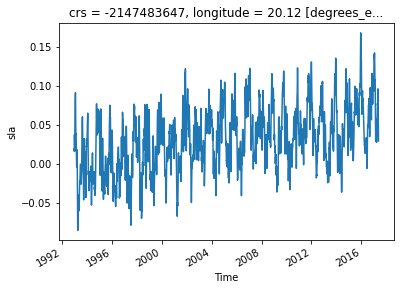

In [26]:
sla_hov.sel(longitude=20, method="nearest").plot()

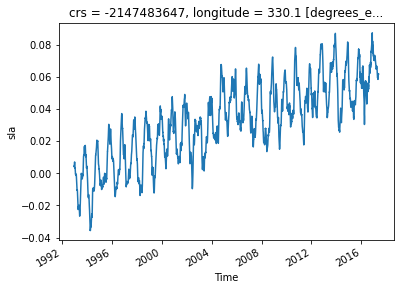

In [28]:
sla_hov.sel(longitude=330, method="nearest").plot()

## Sea Level Variability

We can examine the natural variability in sea level by looking at its standard deviation in time.

In [29]:
sla_std = ds.sla.std(dim='time').load()


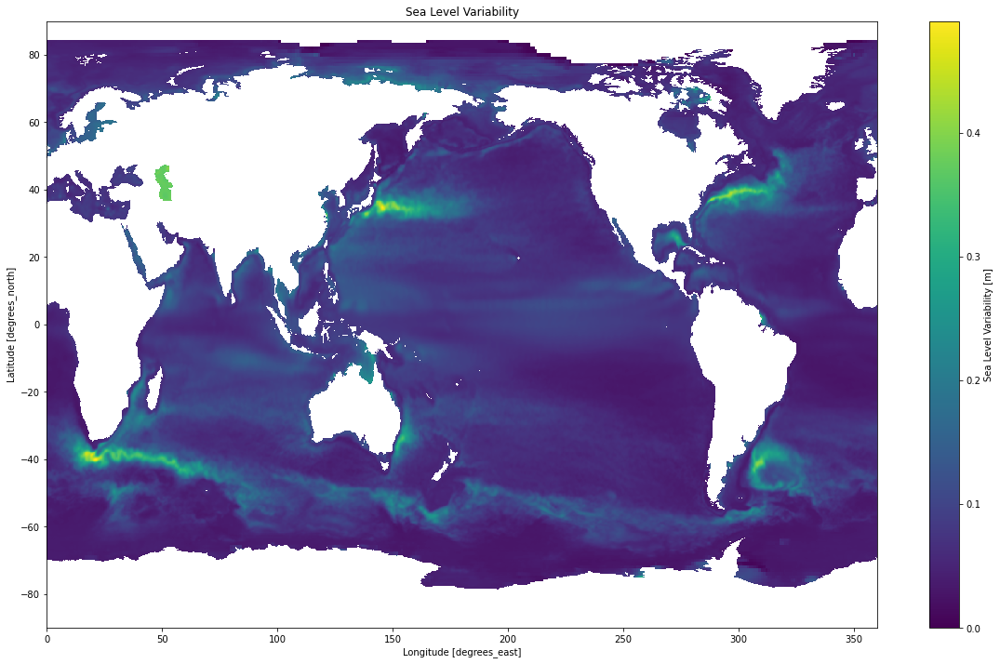

In [33]:
sla_std.name = 'Sea Level Variability [m]'
ax = sla_std.plot(figsize=(20, 12))
_ = plt.title('Sea Level Variability')

In [34]:
ds_SO = ds.sel(latitude=slice(-90, -30))

In [35]:
ds_SO

<xarray.Dataset>
Dimensions:    (time: 8901, latitude: 240, longitude: 1440, nv: 2)
Coordinates:
    crs        int32 -2147483647
    lat_bnds   (time, latitude, nv) float32 dask.array<chunksize=(5, 240, 2), meta=np.ndarray>
  * latitude   (latitude) float32 -89.88 -89.62 -89.38 ... -30.62 -30.38 -30.12
    lon_bnds   (longitude, nv) float32 dask.array<chunksize=(1440, 2), meta=np.ndarray>
  * longitude  (longitude) float32 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9
  * nv         (nv) int32 0 1
  * time       (time) datetime64[ns] 1993-01-01 1993-01-02 ... 2017-05-15
Data variables:
    adt        (time, latitude, longitude) float64 dask.array<chunksize=(5, 240, 1440), meta=np.ndarray>
    err        (time, latitude, longitude) float64 dask.array<chunksize=(5, 240, 1440), meta=np.ndarray>
    sla        (time, latitude, longitude) float64 dask.array<chunksize=(5, 240, 1440), meta=np.ndarray>
    ugos       (time, latitude, longitude) float64 dask.array<chunksize=(5, 240, 1440), meta=np.ndarray>
    ugosa      (time, latitude, longitude) float64 dask.array<chunksize=(5, 240, 1440), meta=np.ndarray>
    vgos       (time, latitude, longitude) float64 dask.array<chunksize=(5, 240, 1440), meta=np.ndarray>
    vgosa      (time, latitude, longitude) float64 dask.array<chunksize=(5, 240, 1440), meta=np.ndarray>
Attributes: (12/43)
    Conventions:                     CF-1.6
    Metadata_Conventions:            Unidata Dataset Discovery v1.0
    cdm_data_type:                   Grid
    comment:                         Sea Surface Height measured by Altimetry...
    contact:                         servicedesk.cmems@mercator-ocean.eu
    creator_email:                   servicedesk.cmems@mercator-ocean.eu
    ...                              ...
    summary:                         SSALTO/DUACS Delayed-Time Level-4 sea su...
    time_coverage_duration:          P1D
    time_coverage_end:               1993-01-01T12:00:00Z
    time_coverage_resolution:        P1D
    time_coverage_start:             1992-12-31T12:00:00Z
    title:                           DT merged all satellites Global Ocean Gr...

In [36]:
%%time
meanSSH = ds_SO.adt.mean('time')
meanSSH.load()

CPU times: user 910 ms, sys: 27.3 ms, total: 937 ms
Wall time: 1min 27s


<xarray.DataArray 'adt' (latitude: 240, longitude: 1440)>
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [0.55741003, 0.55863018, 0.55862276, ..., 0.55382811, 0.55452683,
        0.55570519],
       [0.54690421, 0.54765065, 0.54721425, ..., 0.54517317, 0.54530013,
        0.54580054],
       [0.53587772, 0.53559893, 0.53469398, ..., 0.53827242, 0.53698969,
        0.53610289]])
Coordinates:
    crs        int32 -2147483647
  * latitude   (latitude) float32 -89.88 -89.62 -89.38 ... -30.62 -30.38 -30.12
  * longitude  (longitude) float32 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9

In [41]:
meanSSH

<xarray.DataArray 'adt' (latitude: 240, longitude: 1440)>
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [0.55741003, 0.55863018, 0.55862276, ..., 0.55382811, 0.55452683,
        0.55570519],
       [0.54690421, 0.54765065, 0.54721425, ..., 0.54517317, 0.54530013,
        0.54580054],
       [0.53587772, 0.53559893, 0.53469398, ..., 0.53827242, 0.53698969,
        0.53610289]])
Coordinates:
    crs        int32 -2147483647
  * latitude   (latitude) float32 -89.88 -89.62 -89.38 ... -30.62 -30.38 -30.12
  * longitude  (longitude) float32 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9

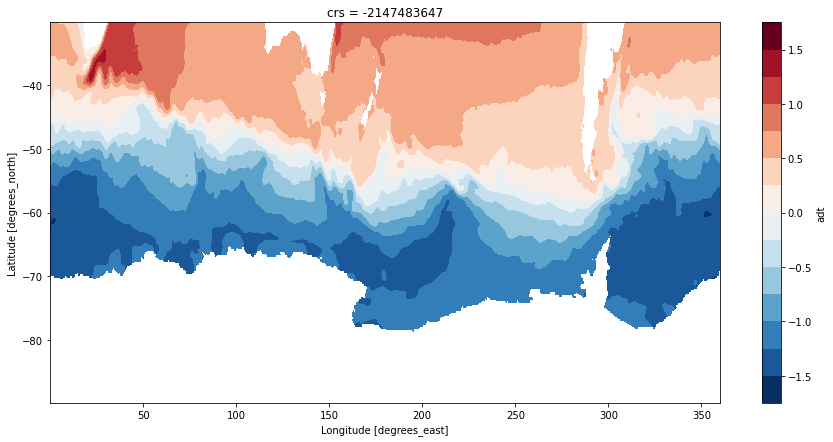

In [40]:
meanSSH.plot.contourf(levels=15,figsize=(15, 7))

In [42]:
%%time
EKE = 0.5*(ds_SO.ugosa**2 + ds_SO.vgosa**2).mean('time')
EKE.load()

CPU times: user 1.39 s, sys: 48.3 ms, total: 1.43 s
Wall time: 3min 8s


<xarray.DataArray (latitude: 240, longitude: 1440)>
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [0.01746615, 0.01709314, 0.01657663, ..., 0.01801851, 0.01811948,
        0.01787562],
       [0.01568796, 0.01547524, 0.01530356, ..., 0.01633004, 0.01627394,
        0.0160184 ],
       [0.01498425, 0.01487367, 0.01473863, ..., 0.01526787, 0.01533445,
        0.01519811]])
Coordinates:
    crs        int32 -2147483647
  * latitude   (latitude) float32 -89.88 -89.62 -89.38 ... -30.62 -30.38 -30.12
  * longitude  (longitude) float32 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9

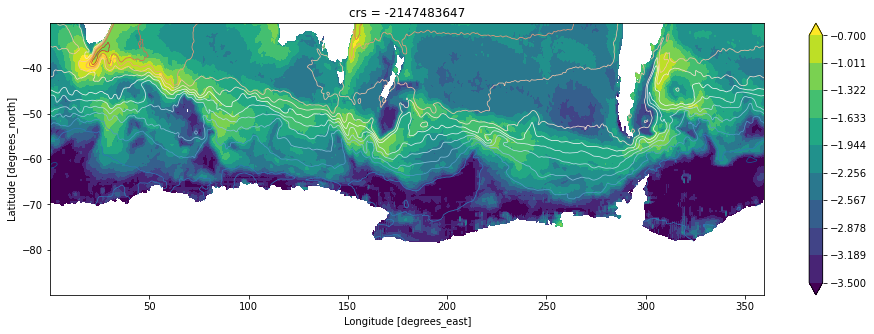

In [57]:
plt.figure(figsize=(16,5))

np.log10(EKE).plot.contourf(vmin=-3.5, vmax=-0.7, levels=10)

meanSSH.plot.contour(levels=15, linewidths=0.75)

# plt.ylim([-80,-30])

In [58]:
%%time
MKE = 0.5*( (ds_SO.ugos - ds_SO.ugosa)**2 + (ds_SO.vgos - ds_SO.vgosa)**2).mean('time')
MKE.load()

CPU times: user 2.11 s, sys: 72.9 ms, total: 2.18 s
Wall time: 6min 2s


<xarray.DataArray (latitude: 240, longitude: 1440)>
array([[       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       [       nan,        nan,        nan, ...,        nan,        nan,
               nan],
       ...,
       [0.00148485, 0.00151059, 0.00155859, ..., 0.00118553, 0.00129569,
        0.00140498],
       [0.00166626, 0.00184368, 0.00198843, ..., 0.00083535, 0.00112082,
        0.00142088],
       [0.00150632, 0.00170676, 0.00180824, ..., 0.00068135, 0.0009368 ,
        0.00123241]])
Coordinates:
    crs        int32 -2147483647
  * latitude   (latitude) float32 -89.88 -89.62 -89.38 ... -30.62 -30.38 -30.12
  * longitude  (longitude) float32 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9

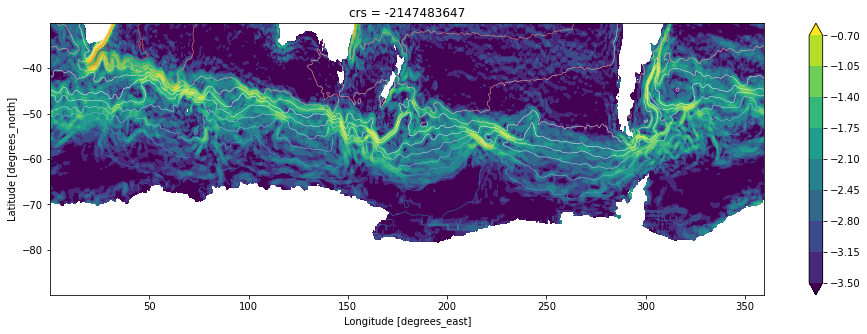

In [59]:
plt.figure(figsize=(16,5))

np.log10(MKE).plot.contourf(vmin=-3.5, vmax=-0.7, levels=9)

meanSSH.plot.contour(levels=15, linewidths=0.5)

In [60]:
ds_means = xr.Dataset()

In [62]:
ds_means['ADT'] = meanSSH
ds_means['EKE'] = EKE
ds_means['MKE'] = MKE

In [64]:
ds_means

<xarray.Dataset>
Dimensions:    (latitude: 240, longitude: 1440)
Coordinates:
    crs        int32 -2147483647
  * latitude   (latitude) float32 -89.88 -89.62 -89.38 ... -30.62 -30.38 -30.12
  * longitude  (longitude) float32 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9
Data variables:
    ADT        (latitude, longitude) float64 nan nan nan ... 0.5383 0.537 0.5361
    EKE        (latitude, longitude) float64 nan nan nan ... 0.01533 0.0152
    MKE        (latitude, longitude) float64 nan nan nan ... 0.0009368 0.001232

In [63]:
ds_means.to_netcdf('means_SSH.nc')